In [687]:
from PIL import Image
import os
from glob import glob
from matplotlib import pyplot as plt
import cv2
import numpy as np

## Get all of the images in the same size so they can all be processed and given the same metrics and get the same effect

In [688]:
def standardize_image(image, target_height, target_width):
    # Get current dimensions
    height, width = image.shape[:2]
    
    # Calculate scaling factors for both dimensions
    height_scale = target_height / height
    width_scale = target_width / width
    
    # Use the smaller scaling factor to maintain aspect ratio
    scale = min(height_scale, width_scale)
    
    # Calculate new dimensions
    new_height = int(height * scale)
    new_width = int(width * scale)
    
    # Resize image
    standardized = cv2.resize(image, (new_width, new_height))
    
    # Create a black canvas of target size
    final_image = np.zeros((target_height, target_width, 3), dtype=np.uint8)
    
    # Calculate positioning to center the image
    y_offset = (target_height - new_height) // 2
    x_offset = (target_width - new_width) // 2
    
    # Place the resized image in the center of the canvas
    final_image[y_offset:y_offset+new_height, x_offset:x_offset+new_width] = standardized
    
    return final_image

## Get parking lines and cars and try to isolate parking lines.
- reads image in and erodes parking lines away so you only have the cars and noise.
- dilates cars and noise so they are around biig enough to resemble the cars in the original binary image.
- xors with original binary image to try get rid of cars and noise and only be left with car lines.

In [818]:
def detect_white_lines(img):
    # Convert to HSV for better white line detection
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    # Define range for white color to isolate it 
    lower_white = np.array([0, 0, 190])#190
    upper_white = np.array([170, 30, 255])
    # Create mask
    white_mask = cv2.inRange(hsv, lower_white, upper_white)

    # Blue lines detection                                               ###Addition of blue lines detection
    lower_blue = np.array([100, 50, 50])
    upper_blue = np.array([130, 255, 255])
    blue_mask = cv2.inRange(hsv, lower_blue, upper_blue)
    
    # Combine masks
    combined_mask = cv2.bitwise_or(white_mask, blue_mask)
    
    kernel_clean = cv2.getStructuringElement(cv2.MORPH_RECT, (2,2))                                 ### Addition of opening
    white_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel_clean, iterations=3)

    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes[0][0].imshow(white_mask, cmap='gray')
    axes[0][0].set_title('Original White Mask')
    axes[0][0].axis('off')
    
    # Open the image to isolate the white blobs and remove the thin white lines
    kernel_car = cv2.getStructuringElement(cv2.MORPH_RECT, (9,5))
    car_blobs = cv2.morphologyEx(white_mask, cv2.MORPH_OPEN, kernel_car, iterations=1)
    
    axes[0][1].imshow(car_blobs, cmap='gray')
    axes[0][1].set_title('Dilated Blobs')
    axes[0][1].axis('off')
    
    
    #Dilate Blobs to get them the same size as before we opened tehm above for the xor operation
    kernel_car = cv2.getStructuringElement(cv2.MORPH_RECT, (2,2))
    car_blobs = cv2.morphologyEx(car_blobs, cv2.MORPH_DILATE, kernel_car, iterations=2)
    
    axes[0][2].imshow(car_blobs, cmap='gray')
    axes[0][2].set_title('Eroded Blobs')
    axes[0][2].axis('off')
    
    # AND between original and inverted car blobs to keep only lines and get rid of car blobs
    car_mask = cv2.bitwise_not(car_blobs)
    just_lines = cv2.bitwise_and(white_mask, car_mask)
    
    axes[1][0].imshow(car_mask, cmap='gray')
    axes[1][0].set_title('Car Mask (Inverted)')
    axes[1][0].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return just_lines

## Once we have parking lines isolated try to improve their visibility so cropping can take place. 
- Firstly blur the image to try minimise nosie.
- Carry out edge detection to impose teh parking lines and get rid of nosie that isn't a majopor edge. 
- Carry out hough transform to try and build lines and join themm together 
- Do dilation and erosion to make the lines stand out a little more before cropping. 
- I think detected parking spaces image doesn't do much for the image here

In [819]:
def detect_parking_lines(img):
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Convert to grayscale if not already
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img

    #Apply edge detection to the system to detect lines can create a little bit of noise but makes lines more visible before Hough transform   
    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Apply Canny edge detection
    edges = cv2.Canny(blurred, 50, 100)
    
    axes[0][0].imshow(edges, cmap='gray')
    axes[0][0].set_title('Edge Detection')
    axes[0][0].axis('off')
    
    #Use Hough transform to connect the lines that have now been detected and connect some of the gaps between the lines
    lines = cv2.HoughLinesP(
        edges,
        rho=1,
        theta=np.pi/180,
        threshold=40,#40 #20 medium
        minLineLength=30,  # Minimum length of line
        maxLineGap=30 #50      # Maximum gap between line segments
    )
    
    # Create separate images for horizontal and vertical lines
    horizontal_lines = np.zeros_like(gray)
    vertical_lines = np.zeros_like(gray)
    
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            
            # Calculate line angle
            angle = np.abs(np.arctan2(y2 - y1, x2 - x1) * 180.0 / np.pi)
            
            # Calculate line length
            length = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
            
            # Classify lines based on angle
            if (angle < 15) or (angle > 165):  #Horizontal lines
                if length > 100:  #Filter by minimum length
                    cv2.line(horizontal_lines, (x1, y1), (x2, y2), 255, 2)
            elif (75 < angle < 105):  #Vertical lines
                if length > 50:  #Filter by minimum length
                    cv2.line(vertical_lines, (x1, y1), (x2, y2), 255, 2)
    
    axes[0][1].imshow(horizontal_lines, cmap='gray')
    axes[0][1].set_title('Horizontal Lines')
    axes[0][1].axis('off')
    
    axes[0][2].imshow(vertical_lines, cmap='gray')
    axes[0][2].set_title('Vertical Lines')
    axes[0][2].axis('off')
    
    # Combine horizontal and vertical lines
    combined_lines = cv2.bitwise_or(horizontal_lines, vertical_lines)
    
    # Clean up the lines
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    cleaned_lines = cv2.morphologyEx(combined_lines, cv2.MORPH_CLOSE, kernel, iterations=2)
    
    axes[1][0].imshow(cleaned_lines, cmap='gray')
    axes[1][0].set_title('Combined Lines')
    axes[1][0].axis('off')
    
    # Hide unused subplot
    axes[1][1].axis('off')  ##Two axises were used for operations but operations didn't have positive impact on the image
    axes[1][2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return cleaned_lines

In [693]:
#   Method used to rotate the image to make it horizontal allowing for better line detection
def rotate_image(image, angle):
    height, width = image.shape[:2]
    center = (width/2, height/2)
    
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, rotation_matrix, (width, height))
    
    return rotated

## Crop image to only detect parking spaces
Try crop the parking regions out based on the vertiical and horizontal lines that have been created in the previous method so we are only left with parking spaces and cars it should be alot easier to then see the occupancy of parkking spaces. 

In [757]:
def crop_parking_regions(parking_area, original_img):
    height, width = parking_area.shape[:2]
    padding_y = -10
    padding_x = 20
    
    # Get projections
    horizontal_projections = np.sum(parking_area, axis=1) #Basically add up all the rows and columns and see how many white pixels is in them
    vertical_projections = np.sum(parking_area, axis=0)
    
    # Normalize projections
    horizontal_projections = horizontal_projections / width #Need to normalise these values in order to be able threshold them 
    vertical_projections = vertical_projections / height
    
    # Find significant horizontal lines
    horizontal_lines = np.where(horizontal_projections > 0.15)[0] ##Anywhere where the projection is greater than 0.15 we will consider it a line in vertical or horizontal direction
    vertical_lines = np.where(vertical_projections > 0.15)[0]
    
    # Group horizontal lines by proximity
    grouped_lines = []
    current_group = [horizontal_lines[0]]
    
    for i in range(1, len(horizontal_lines)):
        if horizontal_lines[i] - horizontal_lines[i-1] < 20: #If the distance between one line and another is under 20 see it as the same parking area
            current_group.append(horizontal_lines[i])
        else:
            grouped_lines.append(current_group)  #If the distance is greater than 20 then it is a new parking area
            current_group = [horizontal_lines[i]]
    grouped_lines.append(current_group)
    
    # Create regions from groups
    crop_coordinates = []  # Store the coordinates for cropping
    min_region_height = height * 0.15
    
    # Find x boundaries using vertical lines - do this once for all crops
    x_start = max(0, vertical_lines[0] - padding_x)  ##making sure start and end is within the image bounds 
    x_end = min(width, vertical_lines[-1] + padding_x)
    
    for i, group in enumerate(grouped_lines):
        if i == 0 or i == len(grouped_lines) - 1:  # more leniant for top or bottom as there might be partial spaces
            start = max(0, min(group) - padding_y)   ##making sure the crop doesn't go off image
            end = min(height, max(group) + padding_y)
            if end - start > min_region_height: # Only consider regions with a minimum height
                crop_coordinates.append((start, end, x_start, x_end))
        else:  # Middle groups need to be more strict
            start = max(0, min(group) - padding_y)
            end = min(height, max(group) + padding_y)
            if end - start > height * 0.2:
                crop_coordinates.append((start, end, x_start, x_end))
    
    # Create figure with enough subplots for both binary and original crops
    num_regions = len(crop_coordinates)
    fig = plt.figure(figsize=(15, 5 * num_regions))
    
    binary_crops = []
    original_crops = []
    
    for i, (y_start, y_end, x_start, x_end) in enumerate(crop_coordinates):
        #Plot each crop depending how many there is 
        binary_crop = parking_area[y_start:y_end, x_start:x_end]
        original_crop = original_img[y_start:y_end, x_start:x_end].copy()  # Make a copy to avoid reference issues
        
        binary_crops.append(binary_crop)
        original_crops.append(original_crop)
        
        ax1 = fig.add_subplot(num_regions, 2, 2*i + 1)
        ax1.imshow(binary_crop, cmap='gray')
        ax1.set_title(f'Region {i+1} - Binary\nSize: {binary_crop.shape}')
        ax1.axis('off')
        
        ax2 = fig.add_subplot(num_regions, 2, 2*i + 2)
        ax2.imshow(cv2.cvtColor(original_crop, cv2.COLOR_BGR2RGB))
        ax2.set_title(f'Region {i+1} - Original\nSize: {original_crop.shape}')
        ax2.axis('off')
    
    plt.tight_layout()
    plt.show()
        
    return binary_crops, original_crops, crop_coordinates

## Draw boxes around firstly the full parking spaces and then each indicviusal parking space and then we should be ready to see if the space is full or empty

In [802]:
def detect_parking_spaces(binary_crop, original_crop):
    height, width = binary_crop.shape[:2]
    
    # Calculate projections and normalize
    vertical_proj = np.sum(binary_crop, axis=0)
    horizontal_proj = np.sum(binary_crop, axis=1)
    vertical_proj = vertical_proj / np.max(vertical_proj)
    
    # Find peaks for vertical lines
    window_size = 3
    v_peaks = []
    for i in range(window_size, len(vertical_proj) - window_size):
        window = vertical_proj[i-window_size:i+window_size]
        if (vertical_proj[i] >= max(window) and 
            vertical_proj[i] > 0.35 and
            (not v_peaks or i - v_peaks[-1] >= 50)):
            v_peaks.append(i)
    
    # Add edge peaks if they're close to expected spacing
    if len(v_peaks) > 1:
        avg_spacing = np.mean([v_peaks[i+1] - v_peaks[i] for i in range(len(v_peaks)-1)]) ##average spacing and compare this to edge cases to see if they should be included
        
        # Check left edge
        if v_peaks[0] > avg_spacing * 0.5:  ##if they are withing 50% of the average spacing they are included
            v_peaks.insert(0, 0)
            
        # Check right edge
        if (width - v_peaks[-1]) > avg_spacing * 0.7:  ##if they are withing 70% of the average spacing they are included
            v_peaks.append(width)
    
    
    h_threshold = 180000
    h_peaks = []
    
    for i in range(len(horizontal_proj)):
        if (horizontal_proj[i] > h_threshold and
            (not h_peaks or i - h_peaks[-1] >= 20)):
            h_peaks.append(i)

    # Draw visualization
    result = original_crop.copy()
    
    # Draw vertical and horizontal lines
    for x in v_peaks:
        cv2.line(result, (x, 0), (x, height), (0, 0, 255), 2)
    
    for y in h_peaks:
        cv2.line(result, (0, y), (width, y), (0, 0, 255), 2)
        
    spot_number = 1
    min_spot_width = 20  # Minimum width 
    
    if len(h_peaks) > 0:  # If we have horizontal divisions
        for i in range(len(v_peaks)-1):
            x1, x2 = v_peaks[i], v_peaks[i+1]
            spot_width = x2 - x1
            
            if spot_width < min_spot_width:
                continue
                
            # Upper spot
            y1, y2 = 0, h_peaks[0]
            spot_height = y2 - y1
            aspect_ratio = spot_width / spot_height if spot_height > 0 else 0
            
            if 0.2 <= aspect_ratio <= 3.0 and spot_width >= min_spot_width:
                cv2.rectangle(result, (x1, y1), (x2, y2), (255, 165, 0), 2)
                cv2.putText(result, str(spot_number), 
                           ((x1 + x2)//2, (y1 + y2)//2),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 165, 0), 2)
                spot_number += 1
            
            # Lower spot
            y1, y2 = h_peaks[0], height
            spot_height = y2 - y1
            aspect_ratio = spot_width / spot_height if spot_height > 0 else 0
            
            if 0.2 <= aspect_ratio <= 3.0 and spot_width >= min_spot_width:
                cv2.rectangle(result, (x1, y1), (x2, y2), (255, 165, 0), 2)
                cv2.putText(result, str(spot_number), 
                           ((x1 + x2)//2, (y1 + y2)//2),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 165, 0), 2)
                spot_number += 1
    
    # Visualization
    fig, axes = plt.subplots(4, 1, figsize=(15, 16))
    
    axes[0].imshow(binary_crop, cmap='gray')
    axes[0].set_title('Binary Image')
    axes[0].axis('off')
    
    axes[1].plot(vertical_proj)
    axes[1].axhline(y=0.3, color='r', linestyle='--', label='Peak Threshold')
    axes[1].set_title('Vertical Projection')
    axes[1].legend()
    
    axes[2].plot(horizontal_proj)
    axes[2].axhline(y=h_threshold, color='r', linestyle='--', label='Threshold')
    axes[2].set_title('Horizontal Projection')
    axes[2].legend()
    
    axes[3].imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    axes[3].set_title('Detected Parking Spaces')
    axes[3].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return v_peaks, h_peaks, result

In [781]:
def extract_parking_spots(original_img, v_peaks, h_peaks):
    height, width = original_img.shape[:2]
    parking_spots = []
    
    # Define vertical sections between consecutive v_peaks
    for i in range(len(v_peaks)-1):
        x1 = v_peaks[i]
        x2 = v_peaks[i+1]
        
        if len(h_peaks) == 0:
            #If no horizontal peaks, treat as one section
            spot = {
                'coords': (x1, 0, x2, height),
                'roi': original_img[0:height, x1:x2]
            }
            parking_spots.append(spot)
        else:
            # Create sections between horizontal lines
            y_sections = [0] + h_peaks + [height]
            for j in range(len(y_sections)-1):
                y1 = y_sections[j]
                y2 = y_sections[j+1]
                
                # Add spot if it has reasonable dimensions
                if 100 > (x2 - x1) > 20 and (y2 - y1) > 20:
                    spot = {
                        'coords': (x1, y1, x2, y2),
                        'roi': original_img[y1:y2, x1:x2]
                    }
                    parking_spots.append(spot)
    
    return parking_spots

In [708]:
def analyze_parking_spot_occupancy(original_crop, spots):
    
    results = []
    vis_img = original_crop.copy()
    
    for i, spot in enumerate(spots, 1):
        x1, y1, x2, y2 = spot['coords']
        spot_roi = spot['roi']
        
        # Convert spot to grayscale for analysis
        gray = cv2.cvtColor(spot_roi, cv2.COLOR_BGR2GRAY)
        
        # Calculate key metrics for occupancy detection
        variance = np.var(gray)
        mean_intensity = np.mean(gray)
        
        # Edge detection to identify potential vehicle edges
        edges = cv2.Canny(gray, 50, 150)
        edge_density = np.sum(edges > 0) / (edges.size)
        
        # Print diagnostic information
        print(f"\nAnalyzing Space {i}:")
        print(f"Variance: {variance:.2f}")
        print(f"Mean Intensity: {mean_intensity:.2f}")
        print(f"Edge density: {edge_density:.3f}")
        
        # Occupancy criteria 
        # You might need to tune these thresholds based on your specific parking lot
        is_occupied = variance > 800 and edge_density > 0.10
        
        # Visualize the results
        color = (0, 0, 255) if is_occupied else (0, 255, 0)
        cv2.rectangle(vis_img, (x1, y1), (x2, y2), color, 2)
        label = f"{i}: {'Occ' if is_occupied else 'Vac'}"
        cv2.putText(vis_img, label, (x1+5, y1+20), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
        
        # Store results
        results.append({
            'coords': (x1, y1, x2, y2),
            'occupied': is_occupied,
            'metrics': {
                'variance': variance,
                'mean_intensity': mean_intensity,
                'edge_density': edge_density
            }
        })
    
    # Visualization of original and analyzed images
    plt.figure(figsize=(15, 5))
    plt.subplot(121)
    plt.imshow(cv2.cvtColor(original_crop, cv2.COLOR_BGR2RGB))
    plt.title('Original Crop')
    plt.axis('off')
    
    plt.subplot(122)
    plt.imshow(cv2.cvtColor(vis_img, cv2.COLOR_BGR2RGB))
    plt.title('Occupancy Analysis')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return results, vis_img

# MAIN PROCESSING  LOOP

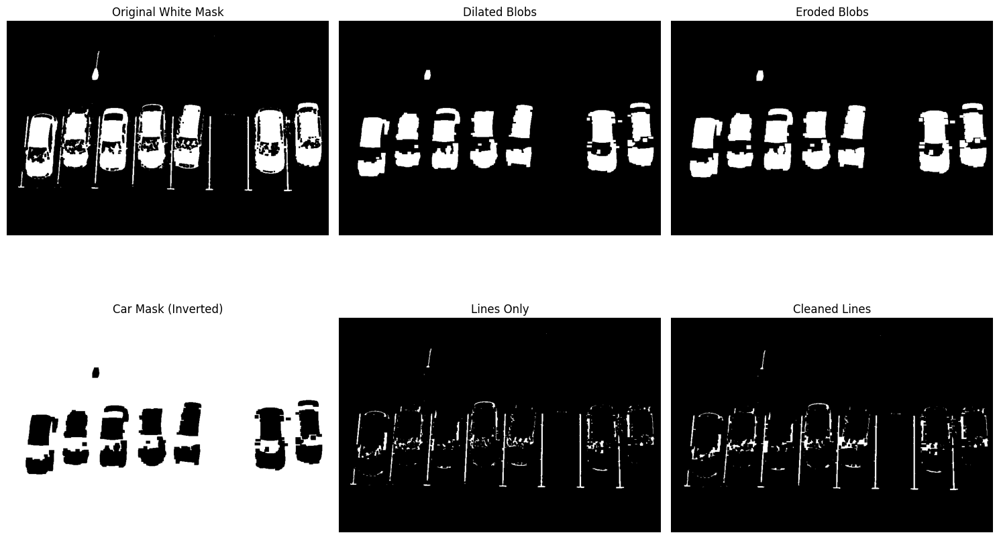

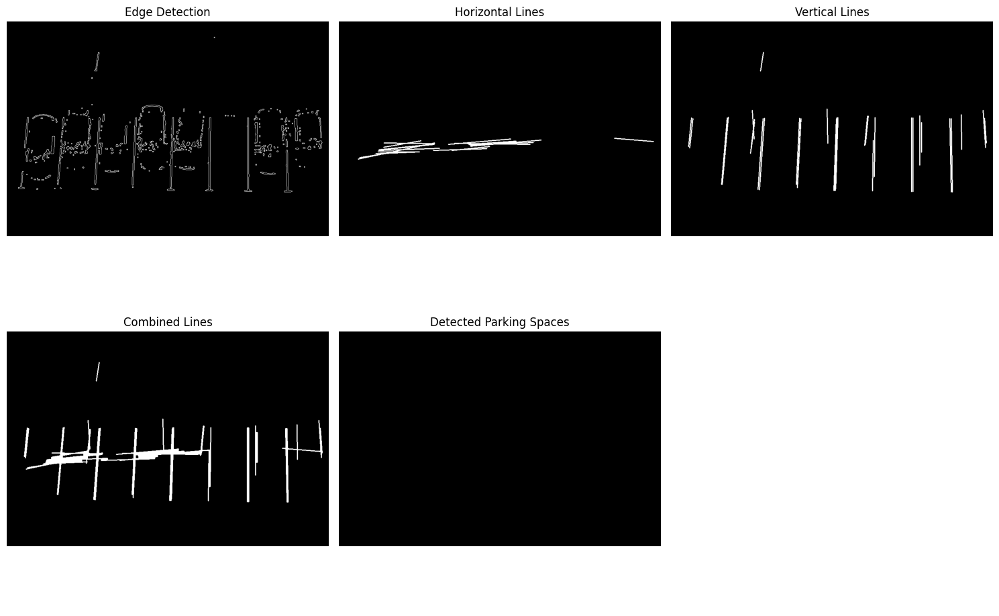

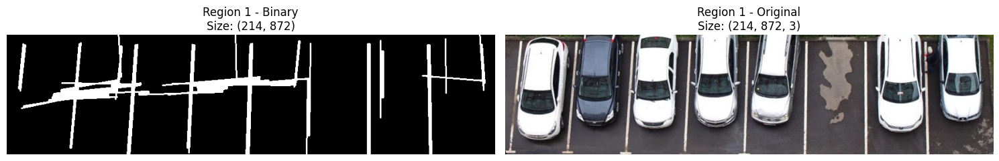

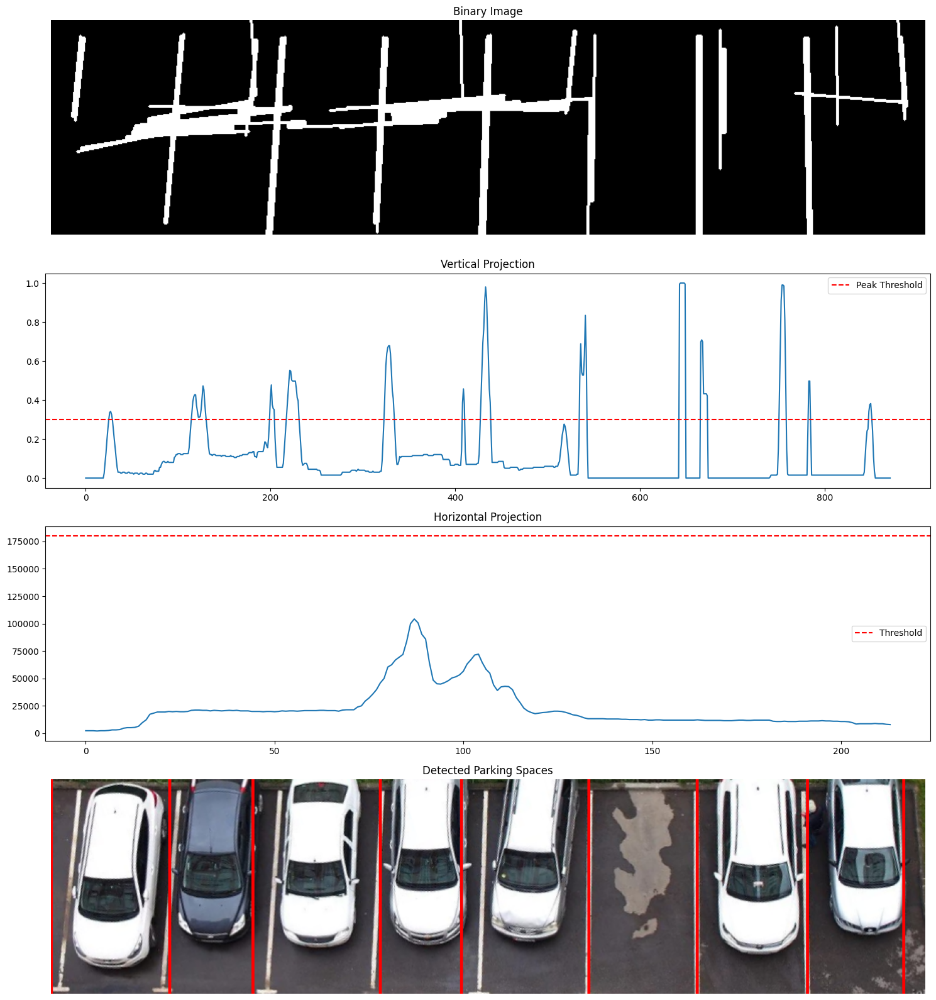


Analyzing Space 1:
Variance: 7507.94
Mean Intensity: 133.90
Edge density: 0.128

Analyzing Space 2:
Variance: 1873.54
Mean Intensity: 83.46
Edge density: 0.124

Analyzing Space 3:
Variance: 7222.94
Mean Intensity: 123.01
Edge density: 0.103

Analyzing Space 4:
Variance: 7840.81
Mean Intensity: 137.56
Edge density: 0.119

Analyzing Space 5:
Variance: 5964.38
Mean Intensity: 115.54
Edge density: 0.119

Analyzing Space 6:
Variance: 1682.92
Mean Intensity: 95.31
Edge density: 0.057

Analyzing Space 7:
Variance: 8223.88
Mean Intensity: 142.07
Edge density: 0.107

Analyzing Space 8:
Variance: 7612.85
Mean Intensity: 117.18
Edge density: 0.114


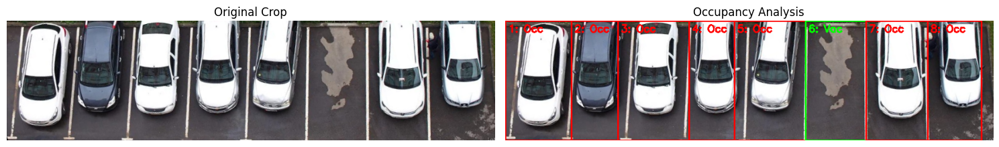

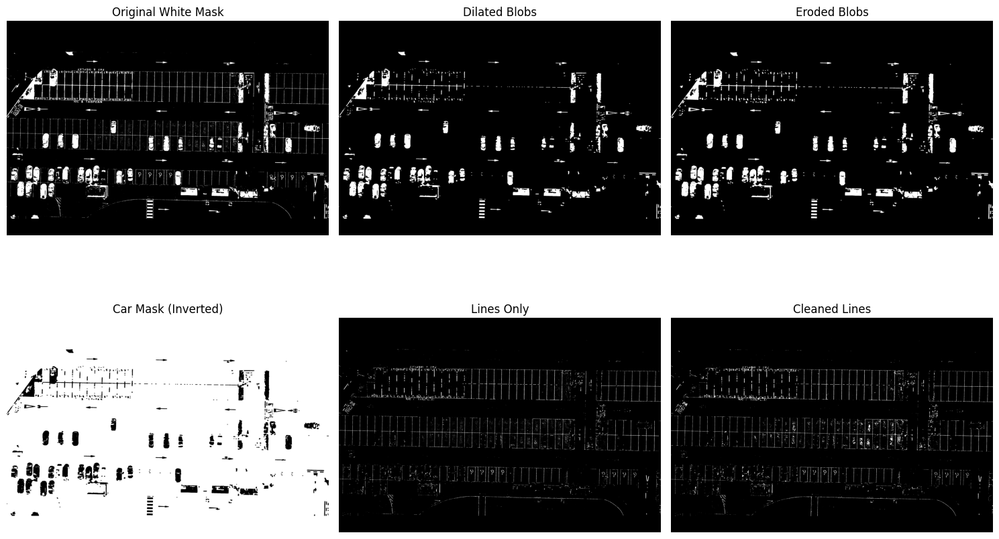

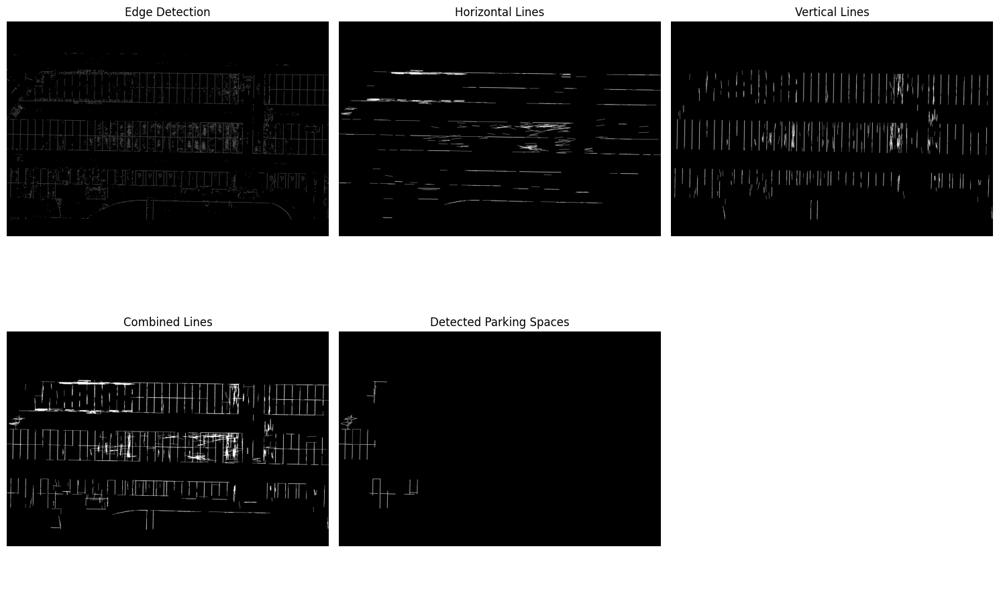

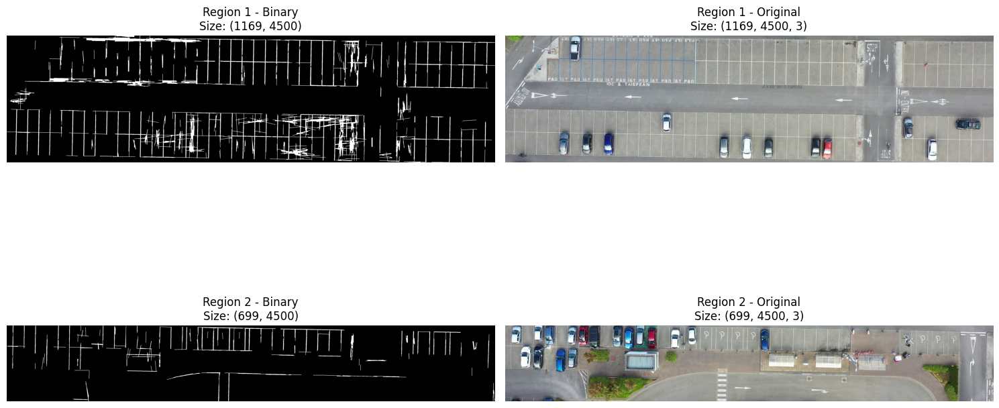

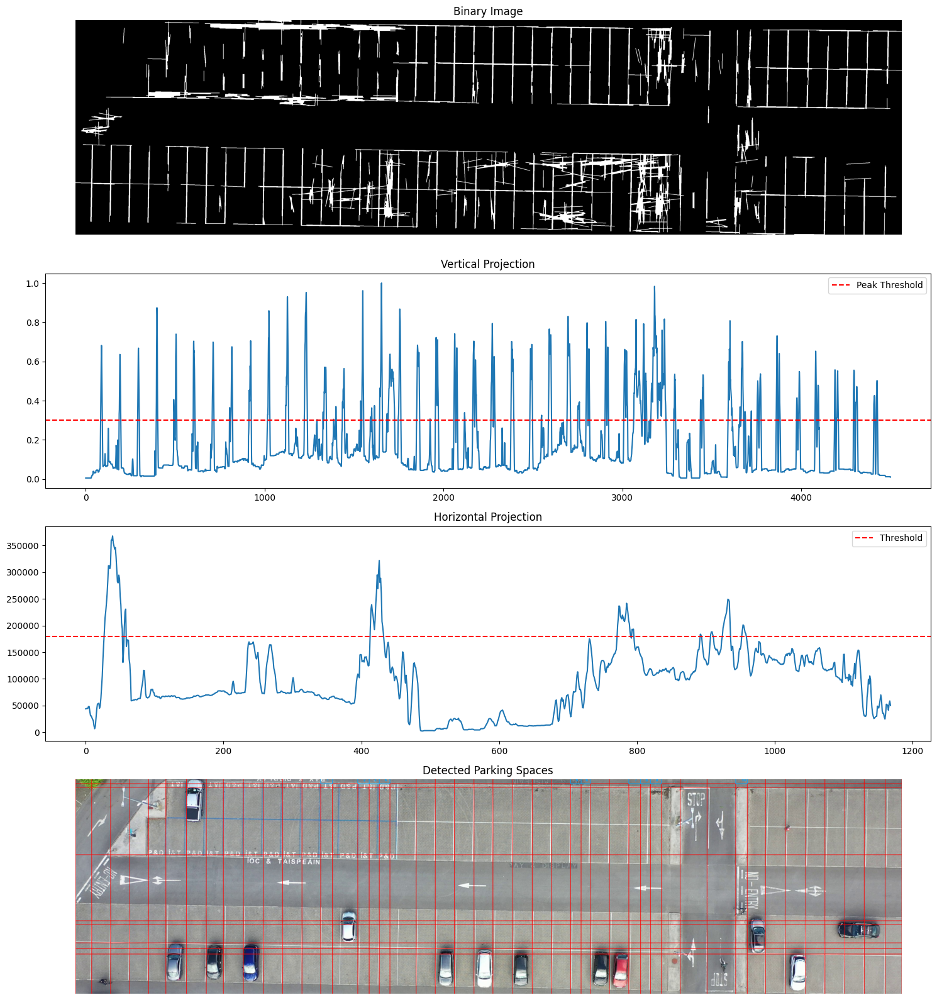


Analyzing Space 1:
Variance: 517.27
Mean Intensity: 122.01
Edge density: 0.262

Analyzing Space 2:
Variance: 184.21
Mean Intensity: 139.05
Edge density: 0.078

Analyzing Space 3:
Variance: 483.31
Mean Intensity: 150.08
Edge density: 0.065

Analyzing Space 4:
Variance: 218.76
Mean Intensity: 146.59
Edge density: 0.016

Analyzing Space 5:
Variance: 383.24
Mean Intensity: 150.20
Edge density: 0.040

Analyzing Space 6:
Variance: 195.91
Mean Intensity: 149.68
Edge density: 0.023

Analyzing Space 7:
Variance: 193.94
Mean Intensity: 154.23
Edge density: 0.075

Analyzing Space 8:
Variance: 369.03
Mean Intensity: 141.72
Edge density: 0.028

Analyzing Space 9:
Variance: 432.98
Mean Intensity: 142.11
Edge density: 0.059

Analyzing Space 10:
Variance: 759.86
Mean Intensity: 170.51
Edge density: 0.106

Analyzing Space 11:
Variance: 487.27
Mean Intensity: 148.19
Edge density: 0.030

Analyzing Space 12:
Variance: 55.91
Mean Intensity: 152.13
Edge density: 0.027

Analyzing Space 13:
Variance: 42.31
M

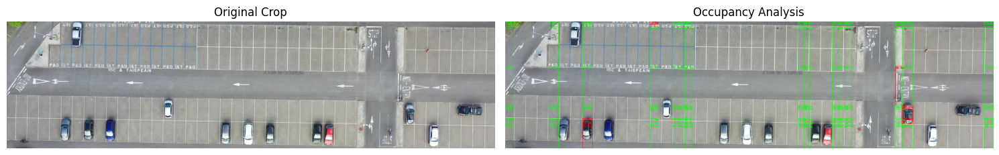

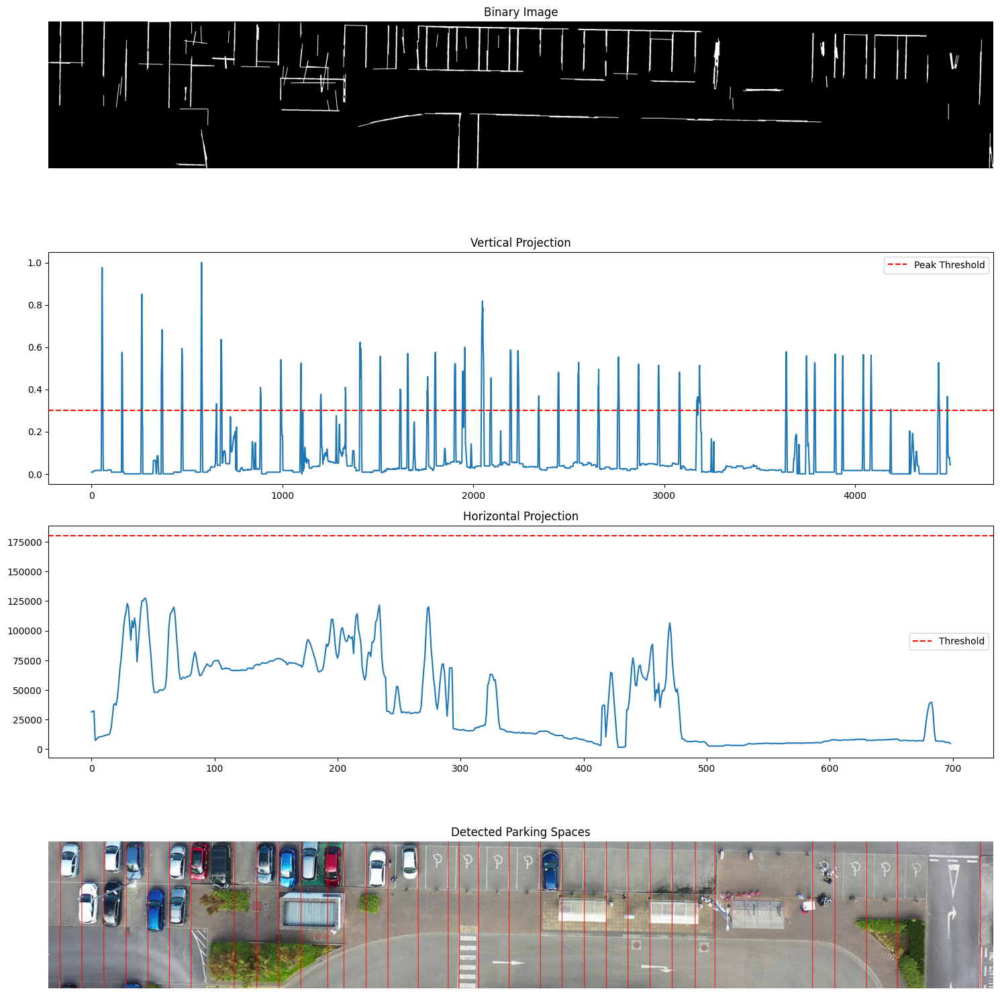


Analyzing Space 1:
Variance: 1945.64
Mean Intensity: 136.34
Edge density: 0.047

Analyzing Space 2:
Variance: 2163.36
Mean Intensity: 143.20
Edge density: 0.043

Analyzing Space 3:
Variance: 2894.71
Mean Intensity: 119.09
Edge density: 0.077

Analyzing Space 4:
Variance: 1532.66
Mean Intensity: 134.84
Edge density: 0.072

Analyzing Space 5:
Variance: 1667.91
Mean Intensity: 128.08
Edge density: 0.052

Analyzing Space 6:
Variance: 2410.64
Mean Intensity: 137.95
Edge density: 0.092

Analyzing Space 7:
Variance: 1881.32
Mean Intensity: 105.16
Edge density: 0.150

Analyzing Space 8:
Variance: 1093.58
Mean Intensity: 110.54
Edge density: 0.180

Analyzing Space 9:
Variance: 1749.40
Mean Intensity: 103.66
Edge density: 0.163

Analyzing Space 10:
Variance: 2526.75
Mean Intensity: 113.57
Edge density: 0.169

Analyzing Space 11:
Variance: 2619.06
Mean Intensity: 127.28
Edge density: 0.134

Analyzing Space 12:
Variance: 2888.62
Mean Intensity: 128.46
Edge density: 0.109

Analyzing Space 13:
Vari

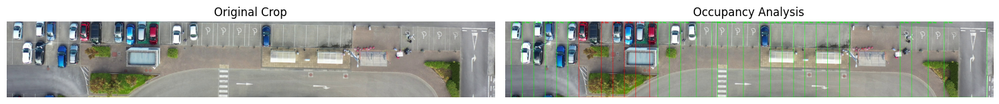

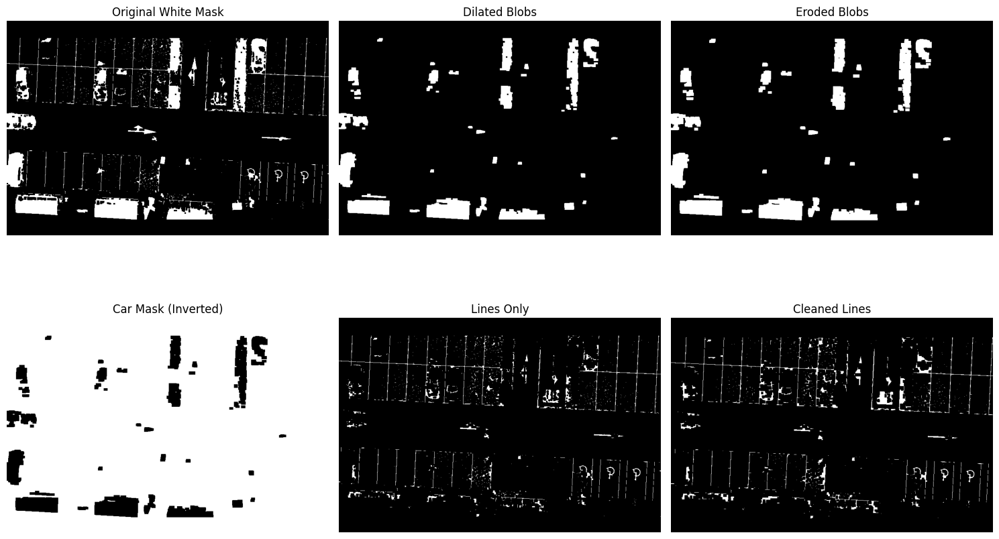

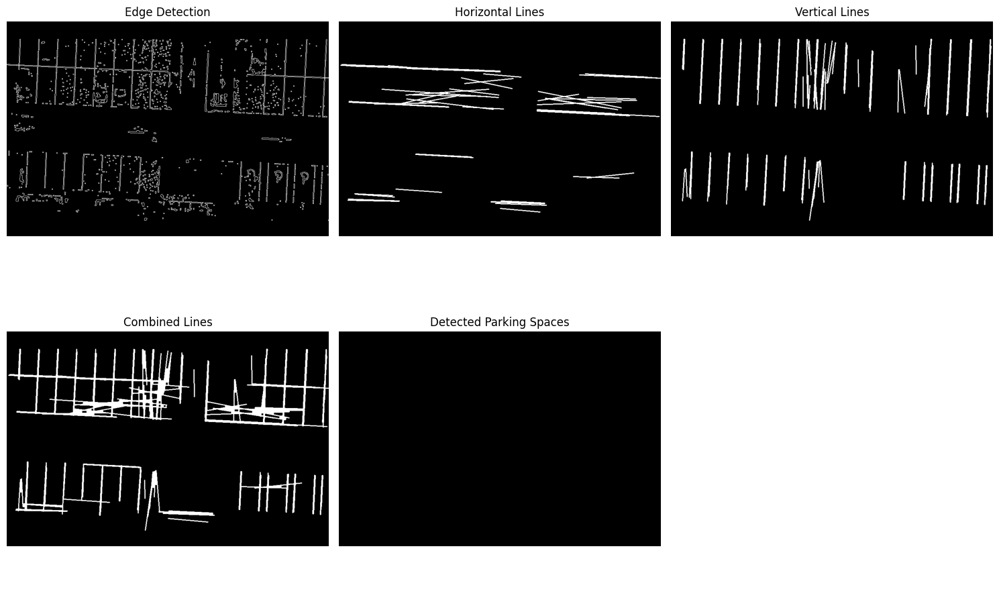

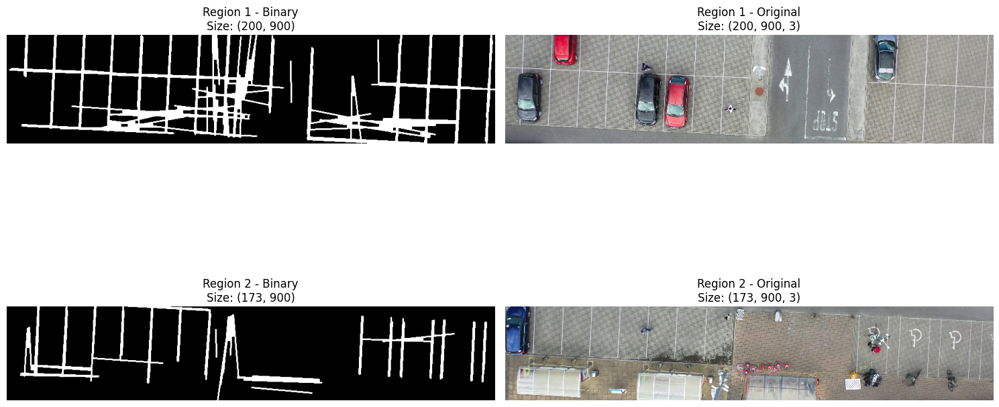

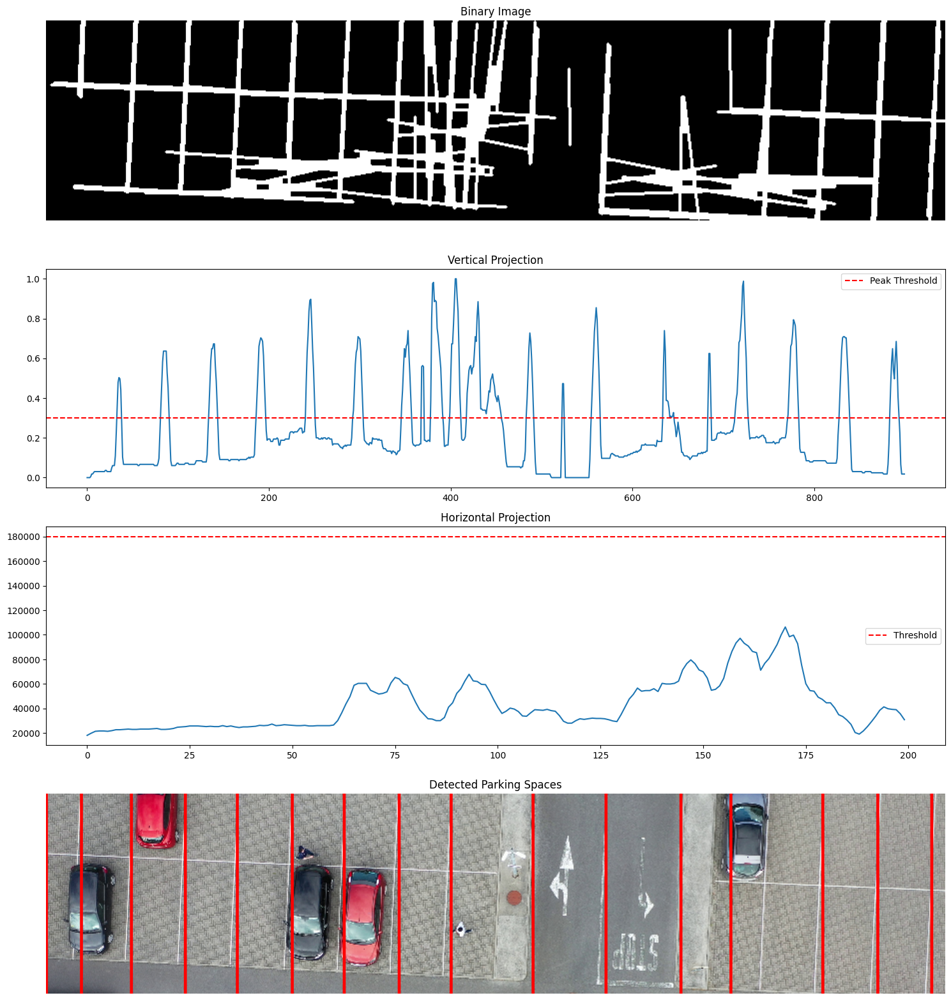


Analyzing Space 1:
Variance: 1112.96
Mean Intensity: 129.07
Edge density: 0.285

Analyzing Space 2:
Variance: 1741.90
Mean Intensity: 117.44
Edge density: 0.265

Analyzing Space 3:
Variance: 1370.13
Mean Intensity: 132.70
Edge density: 0.287

Analyzing Space 4:
Variance: 534.04
Mean Intensity: 152.65
Edge density: 0.340

Analyzing Space 5:
Variance: 722.89
Mean Intensity: 150.44
Edge density: 0.349

Analyzing Space 6:
Variance: 2425.21
Mean Intensity: 118.82
Edge density: 0.301

Analyzing Space 7:
Variance: 1619.43
Mean Intensity: 137.03
Edge density: 0.306

Analyzing Space 8:
Variance: 582.53
Mean Intensity: 158.77
Edge density: 0.380

Analyzing Space 9:
Variance: 693.67
Mean Intensity: 166.67
Edge density: 0.324

Analyzing Space 10:
Variance: 507.70
Mean Intensity: 135.14
Edge density: 0.064

Analyzing Space 11:
Variance: 425.71
Mean Intensity: 139.18
Edge density: 0.085

Analyzing Space 12:
Variance: 1199.79
Mean Intensity: 165.12
Edge density: 0.270

Analyzing Space 13:
Variance: 

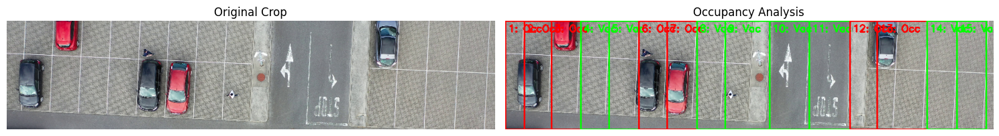

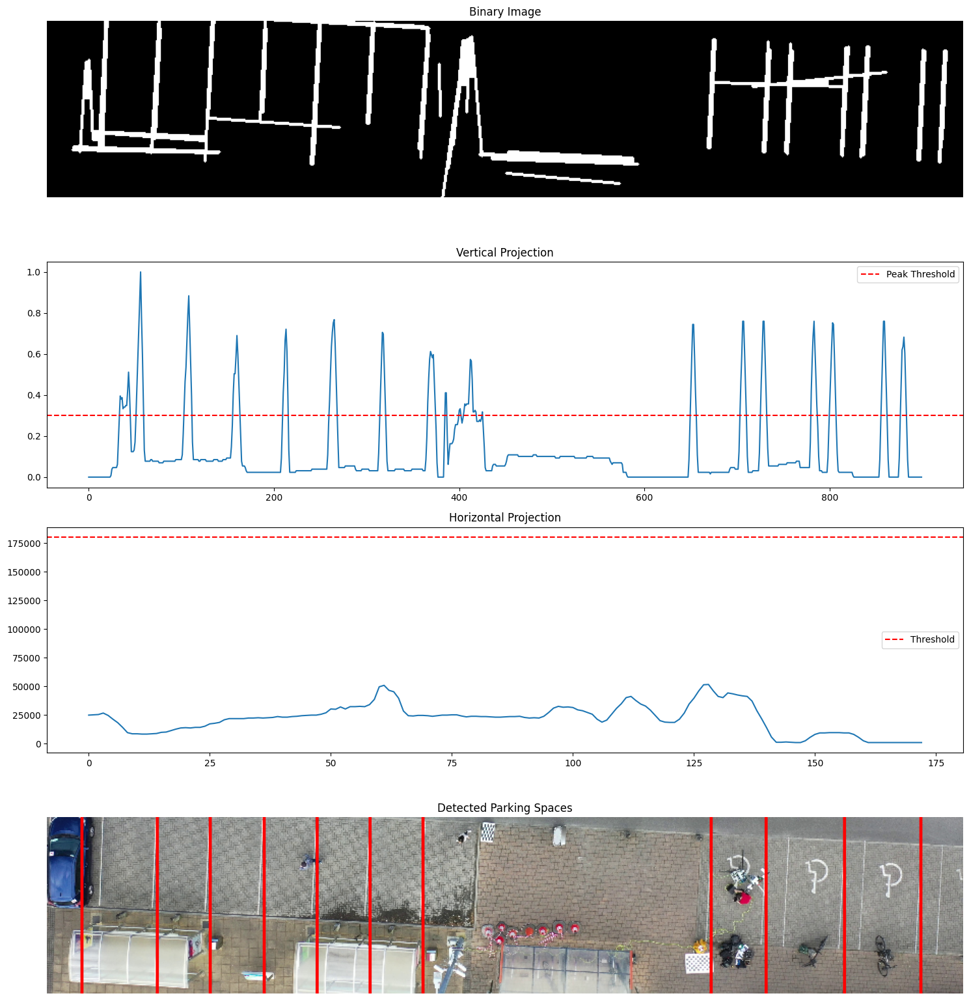


Analyzing Space 1:
Variance: 2678.00
Mean Intensity: 147.57
Edge density: 0.250

Analyzing Space 2:
Variance: 1306.71
Mean Intensity: 151.17
Edge density: 0.294

Analyzing Space 3:
Variance: 602.88
Mean Intensity: 146.27
Edge density: 0.306

Analyzing Space 4:
Variance: 1099.29
Mean Intensity: 151.26
Edge density: 0.314

Analyzing Space 5:
Variance: 2070.23
Mean Intensity: 158.37
Edge density: 0.332

Analyzing Space 6:
Variance: 1964.82
Mean Intensity: 157.59
Edge density: 0.307

Analyzing Space 7:
Variance: 897.77
Mean Intensity: 144.36
Edge density: 0.359

Analyzing Space 8:
Variance: 1394.85
Mean Intensity: 132.84
Edge density: 0.225

Analyzing Space 9:
Variance: 626.57
Mean Intensity: 140.45
Edge density: 0.229

Analyzing Space 10:
Variance: 563.66
Mean Intensity: 138.58
Edge density: 0.215


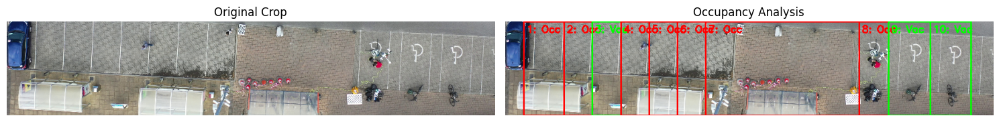

In [803]:
# Main processing loop
image_dir = 'c:/Users/Patrick/Documents/EmbeddedImageProcessing/Mini-Project/Mini_project_images/hard/*'
image_files = [file for file in glob(image_dir, recursive=True) if file.endswith(('.jpg', '.png'))]
all_results = []    

for i, file in enumerate(image_files):
    original_img = cv2.imread(file)
    if(i==0 or i==2):
        standardized = standardize_image(original_img, 600, 900)
    else:
        standardized = standardize_image(original_img, 3000, 4500)
    if i==0:
        standardized = rotate_image(standardized, 17)  
    parking_spaces = detect_white_lines(standardized)
    parking_lines = detect_parking_lines(parking_spaces)
    
    binary_crops, original_crops, crop_coordinates = crop_parking_regions(parking_lines, standardized)

    for binary_crop, original_crop in zip(binary_crops, original_crops):
        
        v_peaks, h_peaks, _  = detect_parking_spaces(binary_crop, original_crop)
        spots = extract_parking_spots(original_crop, v_peaks, h_peaks)
        cv2.waitKey(1000)
        occupancy_results, annotated_img = analyze_parking_spot_occupancy(original_crop, spots)
        all_results.extend(occupancy_results)